<div style="border-radius:10px; padding: 15px; background-color: #F0F8FF; font-size:100%; text-align:center">

<h1 align="center"><font color=#000000>OCR Smackdown: Keras_OCR vs Pytesseract vs EasyOCR</font></h1>


  [![GitHub](https://img.shields.io/badge/GitHub-Profile-blue?style=for-the-badge&logo=github)](https://github.com/iammuhammadfurqan)

  [![Kaggle](https://img.shields.io/badge/Kaggle-Profile-blue?style=for-the-badge&logo=kaggle)](https://www.kaggle.com/muhammadfurqan0)

  [![LinkedIn](https://img.shields.io/badge/LinkedIn-Profile-blue?style=for-the-badge&logo=linkedin)](https://www.linkedin.com/in/iammuhammadfurqan/)

  [![Gmail](https://img.shields.io/badge/Gmail-Contact%20Me-red?style=for-the-badge&logo=gmail)](mailto:sheikhfurqan048@gmail.com)

<div style="border-radius:10px; padding: 15px; background-color: #F0F8FF; font-size:130%; text-align:left">

<h2 align="left"><font color=#000000>Data Description</font></h2>
The TextOCR dataset is a collection of images sourced from various sources containing textual content. The primary purpose of this dataset is to facilitate research and benchmarking in the field of Optical Character Recognition (OCR) systems. The dataset provides a diverse range of images with different text styles, fonts, sizes, orientations, and backgrounds to evaluate the performance of OCR algorithms under various conditions.

## AIM: *`To conduct a comprehensive analysis of Optical Character Recognition (OCR) systems, specifically comparing the performance of Keras-OCR, Pytesseract, and EasyOCR algorithms on text extraction from images.`*

## Objectives:

1. `Evaluate the accuracy and robustness of Keras-OCR, Pytesseract, and EasyOCR in extracting textual content from images under various conditions, including different text styles, fonts, sizes, orientations, and backgrounds.`
2. `Compare the computational efficiency and resource utilization of the OCR algorithms to determine their suitability for real-time or large-scale text extraction tasks.`
3. `Assess the scalability of each OCR system by analyzing its performance across datasets of varying sizes and complexities.`
4. `Investigate the impact of preprocessing techniques, such as image enhancement and noise reduction, on the OCR accuracy and reliability.`
5. `Explore the potential limitations and failure modes of each OCR system and identify areas for improvement or optimization.`
6. `Provide actionable insights and recommendations for selecting the most suitable OCR solution based on specific use cases and requirements.`

## Outcome:
`A comprehensive analysis report detailing the comparative evaluation of Keras-OCR Pytesseract, and EasyOCR algorithms for text extraction from images, along with actionable recommendations for selecting the most appropriate OCR solution for various practical applications.
`

In [1]:
# ! pip install -q kaggle

In [2]:
 # from google.colab import files
 # files.upload()

In [3]:
# ! mkdir ~/.kaggle

In [4]:
# ! cp kaggle.json ~/.kaggle/

In [5]:
# ! chmod 600 ~/.kaggle/kaggle.json

In [6]:
# ! kaggle datasets download -d robikscube/textocr-text-extraction-from-images-dataset

In [7]:
# !unzip textocr-text-extraction-from-images-dataset.zip

### ***Text Extraction from Images in Python***

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Importing Data & Libraries</p>

In [8]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from glob import glob
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from PIL import Image

In [9]:
annot = pd.read_parquet("/kaggle/input/textocr-text-extraction-from-images-dataset/annot.parquet")
images = pd.read_parquet("/kaggle/input/textocr-text-extraction-from-images-dataset/img.parquet")
images_fns = glob("/kaggle/input/textocr-text-extraction-from-images-dataset/train_val_images/train_images/*")

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Plot Example Images</p>


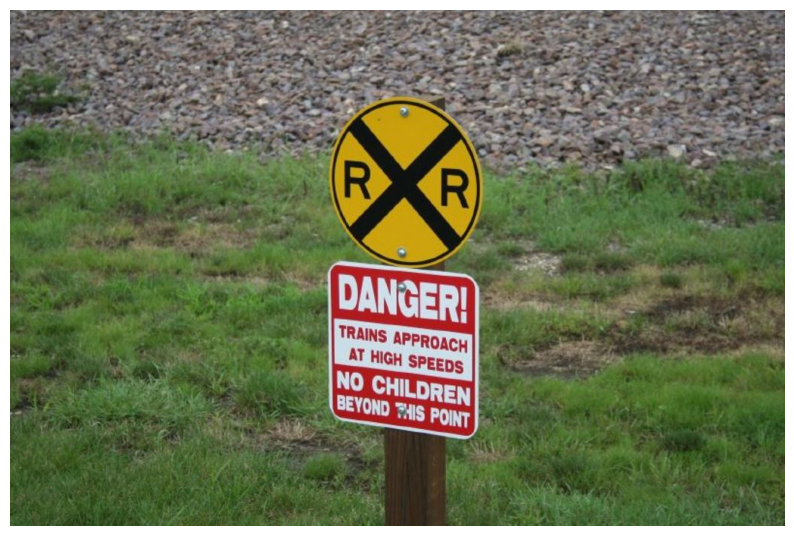

In [10]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(plt.imread(images_fns[6]))
ax.axis('off')
plt.show()

In [11]:
# 1st way to get the image ID
# image_id = images_fns[0].split('/')[-1].split('.')[0]

# 2st way to get the image ID
image_id = images_fns[0].split('/')[-1].rstrip('.jpg')
annot.query('image_id == @image_id')


,id,image_id,bbox,utf8_string,points,area
674889,f644219f560e3778_1,f644219f560e3778,"[64.54, 22.34, 75.25, 47.22]",.,"[67.49, 22.34, 139.79, 28.25, 139.79, 69.56, 6...",3553.30
674890,f644219f560e3778_2,f644219f560e3778,"[68.97, 62.18, 419.03, 191.81]",EXTRA,"[77.82, 62.18, 488.0, 71.03, 483.57, 253.99, 6...",80374.14
674891,f644219f560e3778_3,f644219f560e3778,"[510.13, 81.36, 486.9, 180.01]",GOLDEN,"[511.6, 81.36, 995.55, 82.84, 997.03, 242.19, ...",87646.87
674892,f644219f560e3778_4,f644219f560e3778,"[89.63, 876.63, 432.3, 118.03]",OK-OYOT,"[91.1, 876.63, 521.93, 889.91, 521.93, 994.66,...",51024.37
674893,f644219f560e3778_5,f644219f560e3778,"[532.26, 892.86, 402.8, 118.03]",SYSTEM,"[532.26, 892.86, 935.06, 910.56, 930.63, 1010....",47542.48


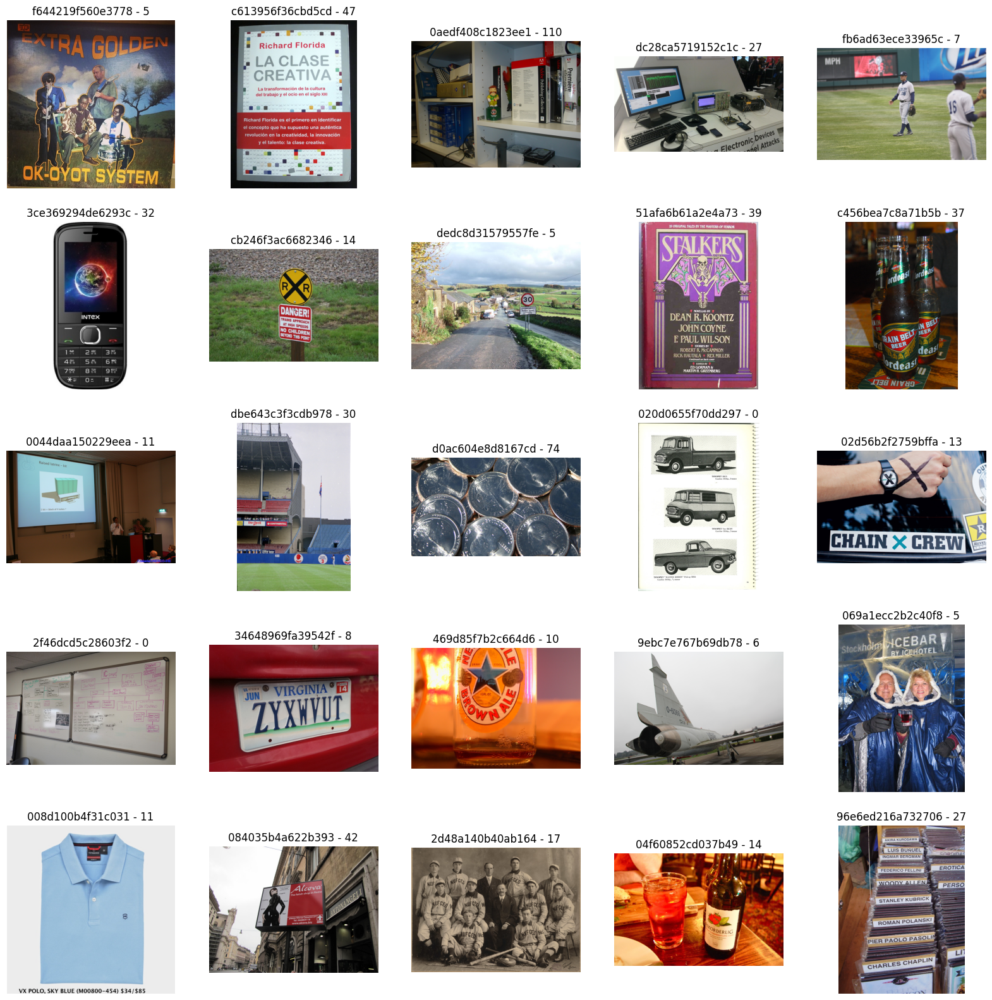

In [12]:
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
axs = axs.flatten()
for i in range(25):
    axs[i].imshow(plt.imread(images_fns[i]))
    axs[i].axis('off')
    image_id = images_fns[i].split('/')[-1].rstrip('.jpg')
    n_annot = len(annot.query('image_id == @image_id'))
    axs[i].set_title(f'{image_id} - {n_annot}')
plt.show()

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">1st Approach: Pytesseract</p>

In [13]:
#!pip install pytesseract

In [14]:
import pytesseract

# Example call
print(pytesseract.image_to_string(images_fns[17], lang='eng'))

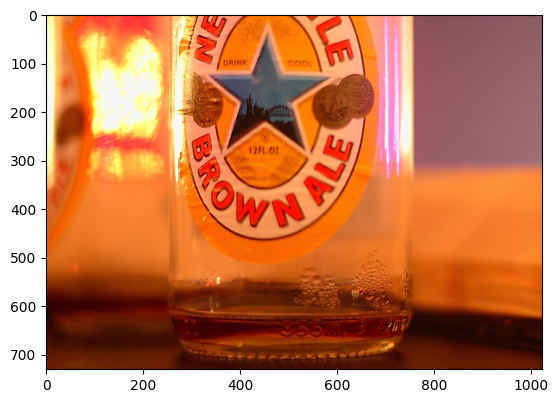

In [15]:
plt.imshow(plt.imread(images_fns[17]))

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">2nd Approach: Easy OCR</p>

In [16]:
# !pip install easyocr

In [17]:
import easyocr

reader = easyocr.Reader(['en'])

In [18]:
results = reader.readtext(images_fns[11])

In [19]:
pd.DataFrame(results, columns=['bbox','text','conf'])

,bbox,text,conf
0,"[[2, 598], [36, 598], [36, 626], [2, 626]]",D,0.120065
1,"[[65, 595], [150, 595], [150, 627], [65, 627]]",Dirtpevil,0.713812
2,"[[201, 607], [303, 607], [303, 623], [201, 623]]",CONIINENTAL,0.422955
3,"[[150, 772], [230, 772], [230, 798], [150, 798]]",Wctt,0.028402
4,"[[228, 798], [262, 798], [262, 822], [228, 822]]",400,0.999471
5,"[[507, 811], [539, 811], [539, 823], [507, 823]]",EARL,0.993944
6,"[[499, 819], [547, 819], [547, 833], [499, 833]]",AVERILL,0.998245
7,"[[361, 839], [389, 839], [389, 853], [361, 853]]",920,0.999452
8,"[[656, 844], [692, 844], [692, 864], [656, 864]]",9303,0.401455


<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Compare Easy OCR vs Pytesseract</p>

In [20]:
# easyocr
reader = easyocr.Reader(['en'], gpu = True)

dfs = []
for img in tqdm(images_fns[:25]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

  0%|          | 0/25 [00:00<?, ?it/s]

In [21]:
import pytesseract
from PIL import Image
import cv2

dfs = []
for img_path in tqdm(images_fns[:25]):
    # Load the image using PIL (Python Imaging Library)
    img = Image.open(img_path)
    
    # Use pytesseract to perform OCR on the image
    text = pytesseract.image_to_string(img)
    
    # Extract additional information if needed, such as bounding boxes
    # bbox = pytesseract.image_to_boxes(img)
    
    # Create a DataFrame to store the OCR results
    img_id = img_path.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame({'text': [text], 'img_id': [img_id]})
    
    # Append the DataFrame to the list
    dfs.append(img_df)

# Concatenate all DataFrames into a single DataFrame
pytesseract_df = pd.concat(dfs)


  0%|          | 0/25 [00:00<?, ?it/s]

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Plotting the Results: Easy OCR vs Pytesseract</p>

In [22]:
def plot_compare(img_fn, easyocr_df, pytesseract_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    # Plot EasyOCR results
    easy_results = easyocr_df.query('img_id == @img_id')['text'].values.tolist()
    img = cv2.imread(img_fn)
    for result in easy_results:
        cv2.putText(img, result, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[0].set_title('EasyOCR Results', fontsize=24)
    axs[0].axis('off')

    # Plot pytesseract results
    pytesseract_results = pytesseract_df.query('img_id == @img_id')['text'].values.tolist()
    img = cv2.imread(img_fn)
    for result in pytesseract_results:
        cv2.putText(img, result, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    axs[1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Pytesseract Results', fontsize=24)
    axs[1].axis('off')

    plt.show()


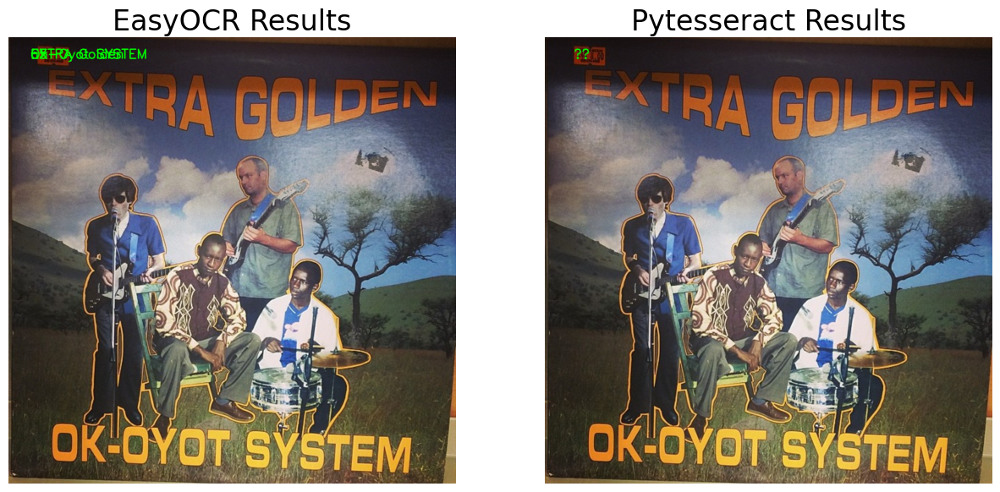

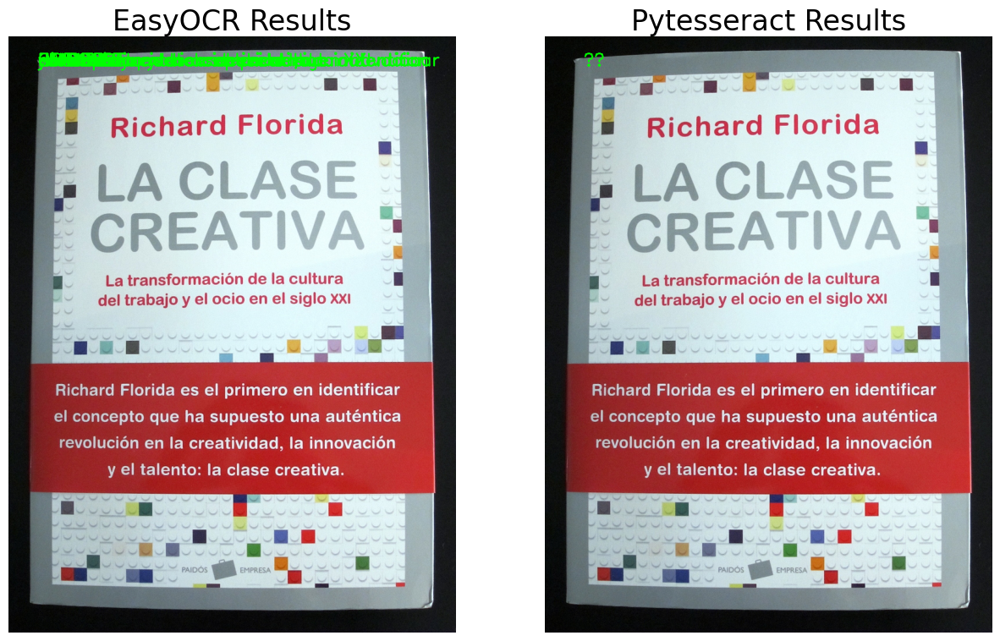

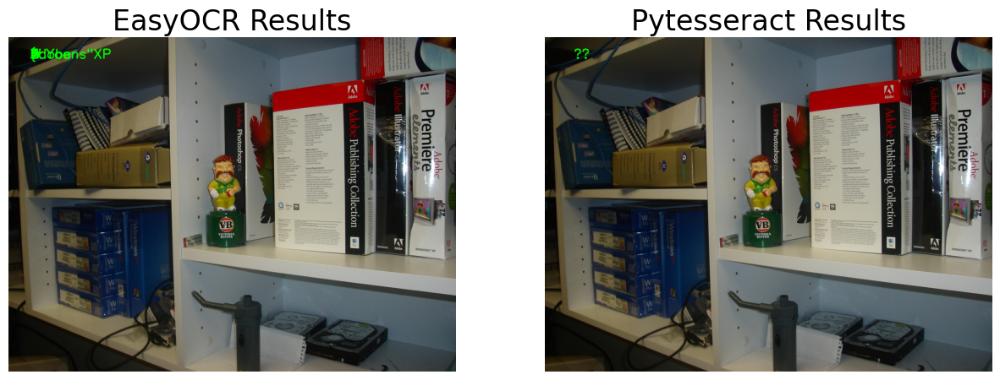

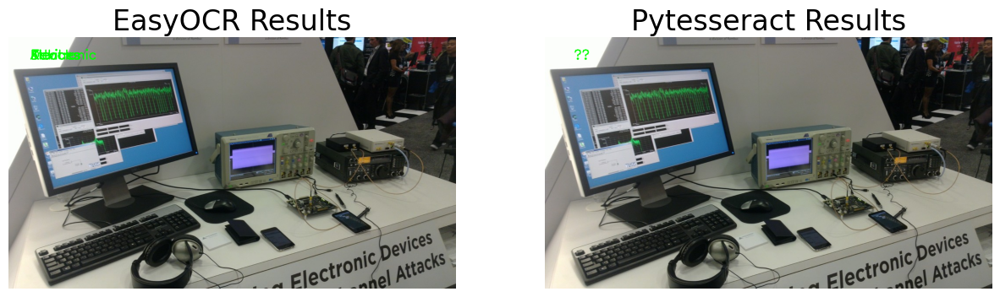

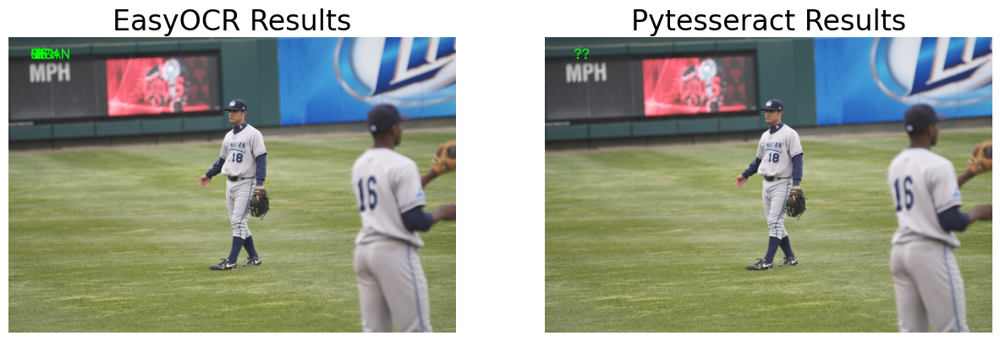

...

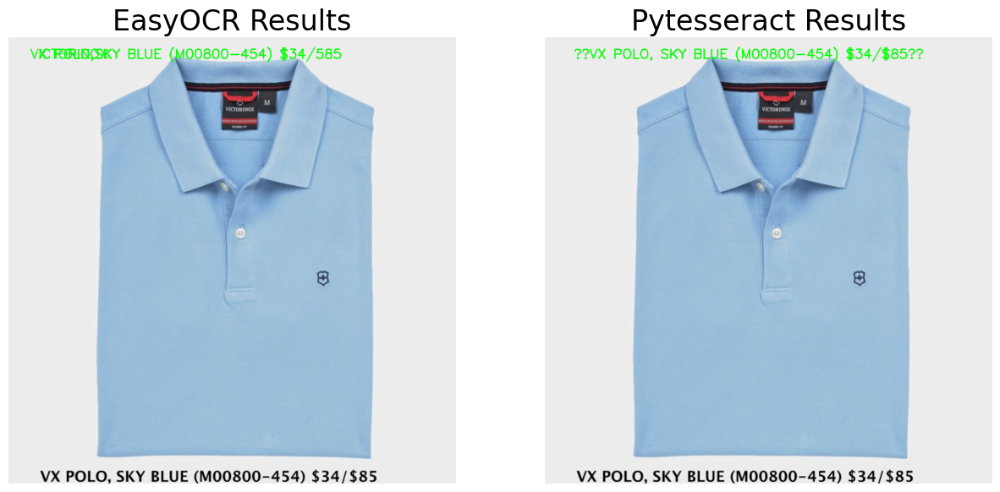

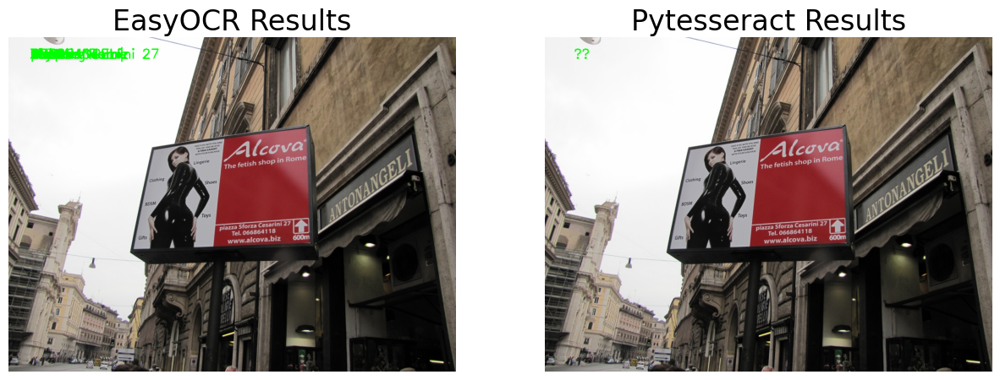

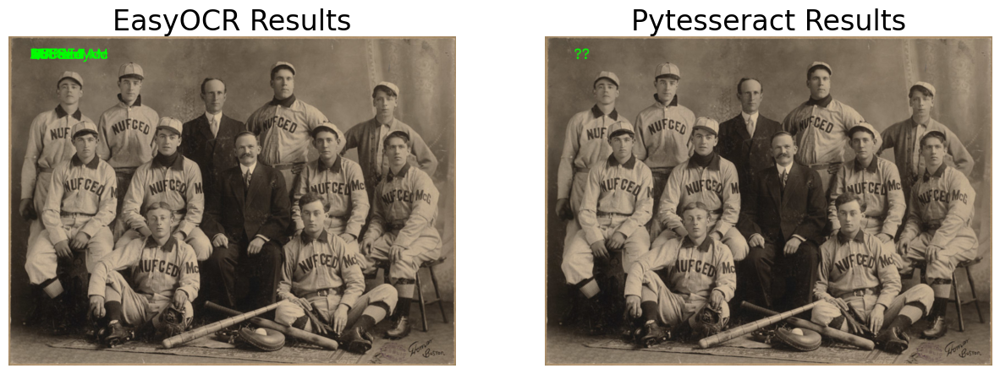

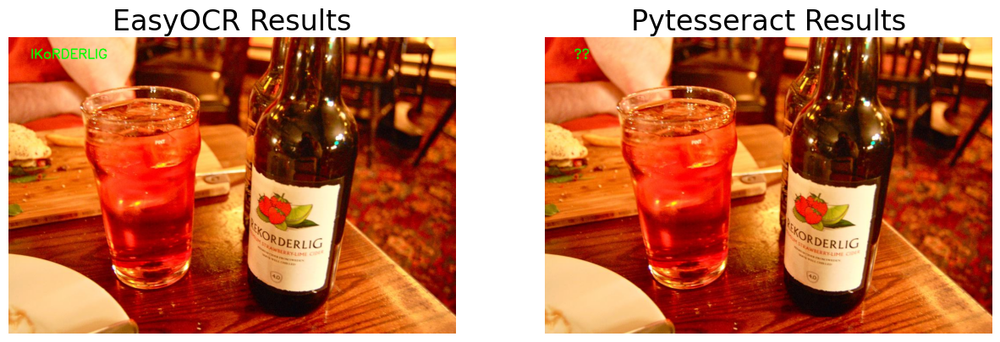

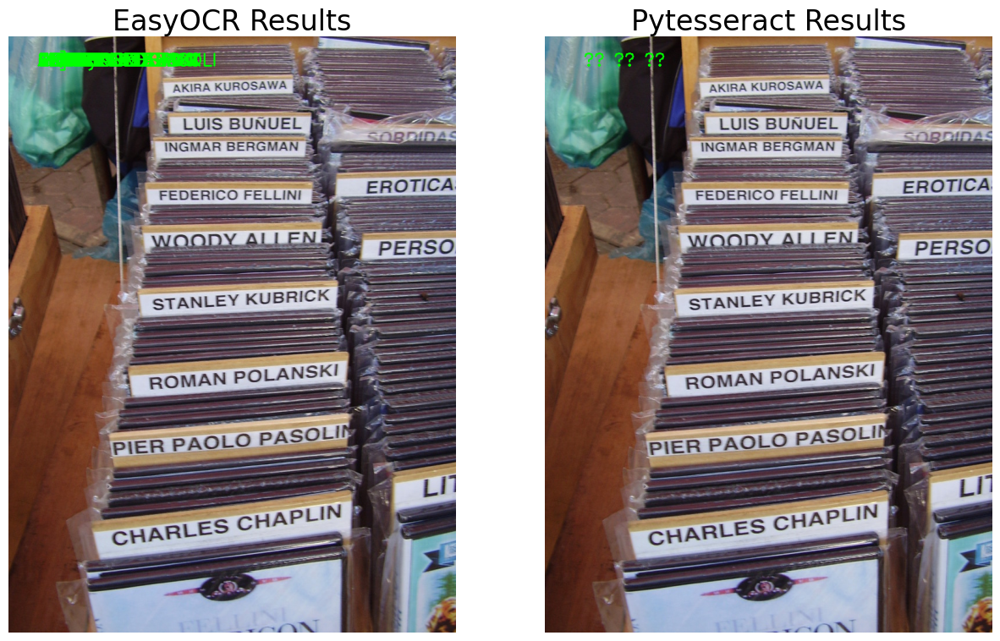

In [23]:
# Loop over results
for img_fn in images_fns[:25]:
    plot_compare(img_fn, easyocr_df, pytesseract_df)


## IMPORTANT NOTE: *`If you want to see the Comparison between `* **Keras_OCR vs Easy_OCR** *`, then you need to Run this Notebook in Google Colab. Because Here You get an Value Error on `* **Keras-OCR.** *` I have already done Colab Set-Up Above `*

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">3rd Approach: Keras OCR</p>

In [24]:
# !pip install git+https://github.com/faustomorales/keras-ocr.git#egg=keras-ocr

In [25]:
# from IPython.display import clear_output
# !pip install keras-ocr
# clear_output()

In [26]:
# import keras_ocr

In [27]:
# pipeline = keras_ocr.pipeline.Pipeline() #Creting a pipline
# kerasocr_preds = pipline.recognize(images)

In [28]:
# results = pipeline.recognize([images_fns[17]])

In [29]:
# fig, ax = plt.subplots(figsize=(10, 10))
# keras_ocr.tools.drawAnnotations(plt.imread(images_fns[17]), results[0], ax=ax)
# ax.set_title('Keras OCR Result Example')
# plt.show()

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Compare Easy OCR vs Keras OCR</p>

In [30]:
# # keras_ocr
# pipeline = keras_ocr.pipeline.Pipeline()

# dfs = []
# for img in tqdm(images_fns[:25]):
#     results = pipeline.recognize([img])
#     result = results[0]
#     img_id = img.split('/')[-1].split('.')[0]
#     img_df = pd.DataFrame(result, columns=['text', 'bbox'])
#     img_df['img_id'] = img_id
#     dfs.append(img_df)
# kerasocr_df = pd.concat(dfs)

<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Plotting the Results: Easy OCR vs Keras OCR</p>

In [31]:
# def plot_compare(img_fn, easyocr_df, kerasocr_df):
#     img_id = img_fn.split('/')[-1].split('.')[0]
#     fig, axs = plt.subplots(1, 2, figsize=(15, 10))

#     easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
#     easy_results = [(x[0], np.array(x[1])) for x in easy_results]
#     keras_ocr.tools.drawAnnotations(plt.imread(img_fn),
#                                     easy_results, ax=axs[0])
#     axs[0].set_title('easyocr results', fontsize=24)

#     keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
#     keras_results = [(x[0], np.array(x[1])) for x in keras_results]
#     keras_ocr.tools.drawAnnotations(plt.imread(img_fn),
#                                     keras_results, ax=axs[1])
#     axs[1].set_title('keras_ocr results', fontsize=24)
#     plt.show()

In [32]:
# # Loop over results
# for img_fn in images_fns[:25]:
#     plot_compare(img_fn, easyocr_df, kerasocr_df)


<a id="Import"></a>
# <p style="background-color: #191970; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Happy Ending</p>